# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 42

**Author 1 (sciper):** Mathieu Schertenleib (313318)  
**Author 2 (sciper):** Alice D'Agostino (403990)  
**Author 3 (sciper):** Jarl Stephansson (402775)  

**Release date:** 05.03.2025   
**Due date:** 19.03.2025 (11:59 pm)


## Key Submission Guidelines:
- **Before submitting your notebook, <span style="color:red;">rerun</span> it from scratch!** Go to: `Kernel` > `Restart & Run All`  
- **Only groups of three will be accepted**, except in exceptional circumstances.  
- **You are not allowed to use any libraries** other than those provided in this notebook.  
- **Failure to follow these guidelines may result in point deductions** during grading.  


[iapr]: https://github.com/LTS5/iapr2025

In [ ]:
# Check is at least python 3.9
import sys

assert (sys.version_info.major == 3) and (sys.version_info.minor == 9)

In [1]:
# Install required packages
!pip install numpy -q
!pip install matplotlib -q
!pip install scikit-image -q
!pip install pillow -q

In [2]:
# Import main packages
from utils.lab_01_utils import *
from skimage.color import rgb2hsv
from skimage.morphology import (
    closing,
    opening,
    disk,
    remove_small_holes,
    remove_small_objects,
    binary_dilation,
)

---
# Introduction


In this lab, we will be working with histological data. Histological images are created from tissue samples that are digitized using high-resolution scanners. Without preparation, human tissues lack visual contrast and have poor tissue differentiations. To overcome this issue, clinical institutes use chemical staining to artificially enhance contrast. The most famous one is called HE (hematoxylin and eosin) staining. Hematoxylin stains tissue nuclei with a deep purple while eosin focuses more on extracellular matrix components with a pink stain.

Before running the following code make sure that the images are located as follows:

```code
├── labs
|   ├── utils
|   |   └── lab_01_utils.py
|   └── lab_01_iapr.ipynb
└── data
    └── data_lab_01
        ├── tcga_crc_example.png
        └── tcga_blood_example.png
```
**⚠️ DO NOT CHANGE THIS CONFIGURATION, AS WE WILL RERUN YOUR NOTEBOOK USING THIS EXACT STRUCTURE!**

By running the following cells you will display a HE histological sample of a colorectal cancer case. It is composed of 3 main entities:
* **Mucin**: Grayish mucus that is secreted by the body. The presence of a tumor tends to increase its presence. 
* **Tumor**: Dark purple aggregates (hematoxylin). Mainly composed of cancerous cells.
* **Other**: Mixture of other cells such as stromal or lymphocytes. It appears mainly pink (eosin) but is dotted with nuclei (purple).

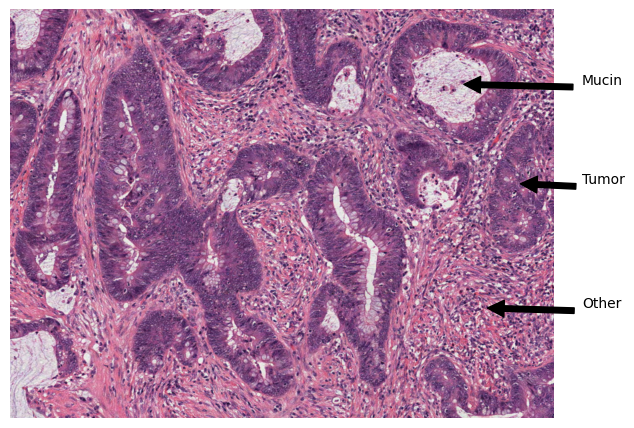

In [3]:
img_he = show_introduction_figure()


# Part 1 - Segmentation [16 pts]

## Part 1.1 - RGB (3 pts)

**Q1 (1 pts)**: In this section, you will have to complete the function `extract_rgb_channels`. The function should extract and return red, blue, and green channels from the input image `img`. Your function will be fed to `plot_colors_histo` to plot the distribution of the colors in the image. 

In [4]:
def extract_rgb_channels(img):
    """
    Extract RGB channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.

    Return
    ------
    data_red: np.ndarray (M, N)
        Red channel of input image
    data_green: np.ndarray (M, N)
        Green channel of input image
    data_blue: np.ndarray (M, N)
        Blue channel of input image
    """

    # Get the shape of the input image
    M, N, _ = np.shape(img)

    # Define default values for RGB channels
    data_red = np.zeros((M, N))
    data_green = np.zeros((M, N))
    data_blue = np.zeros((M, N))

    # ------------------
    # Your code here ...
    # ------------------

    data_red[:] = img[..., 0]
    data_green[:] = img[..., 1]
    data_blue[:] = img[..., 2]

    return data_red, data_green, data_blue

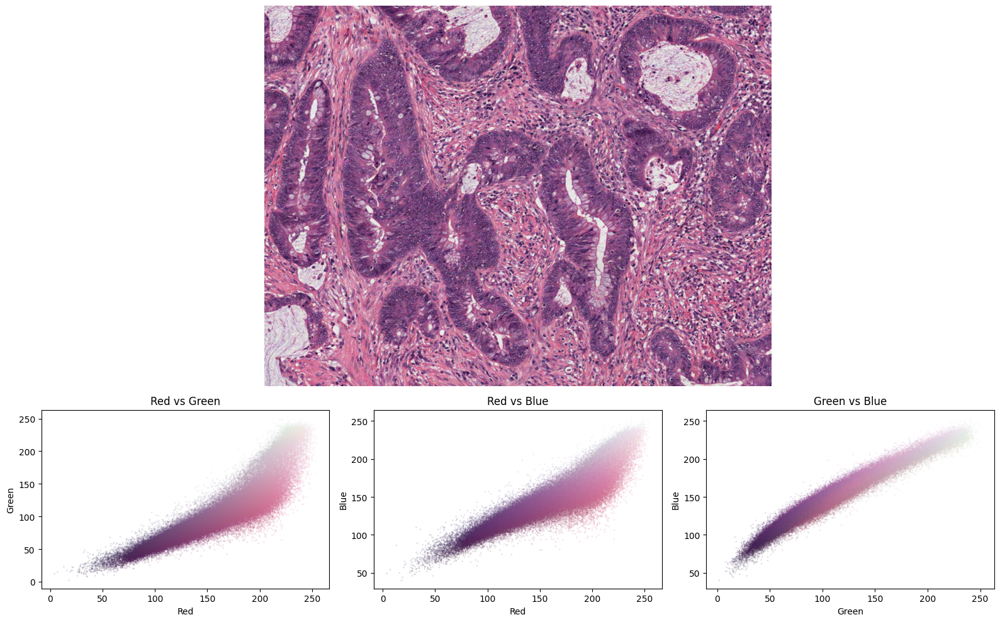

In [5]:
################################################################
############################ TEST ##############################
################################################################

plot_colors_histo(
    img=img_he,
    func=extract_rgb_channels,
    labels=["Red", "Green", "Blue"],
)

Based on the result of the plot above

* **Q2 (1 pts)**: Do you think you can find a simple manual thresholding approach to isolate the tumor components? (Justify)
    * **Answer**: Yes, it is possible to find a manual thresholding approach to isolate tumor components (dark purple in the image). Using different threshold we can select those pixels whose RGB values results in dark purple. This values can be derived qualitatively from the plot above
* **Q3 (1 pts)**: Implement your own manual thresholding in `apply_rgb_threshold` to estimate the tumor location. Use the function `plot_thresholded_image` below to display your estimation results. Do you think your estimation is reliable? (justify)
    * **Answer**: The estimation is not reliable since we have selected qualitatively the values for the threshold, but it is a good approximation

In [6]:
def apply_rgb_threshold(img):
    """
    Apply threshold to input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.

    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract RGB channels
    data_red, data_green, data_blue = extract_rgb_channels(img=img)

    # ------------------
    # Your code here ...
    # ------------------

    range_red = (90, 150)
    range_green = (50, 100)
    range_blue = (100, 170)
    img_th[
        (data_red >= range_red[0])
        & (data_red <= range_red[1])
        & (data_green >= range_green[0])
        & (data_green <= range_green[1])
        & (data_blue >= range_blue[0])
        & (data_blue <= range_blue[1])
    ] = 1

    return img_th

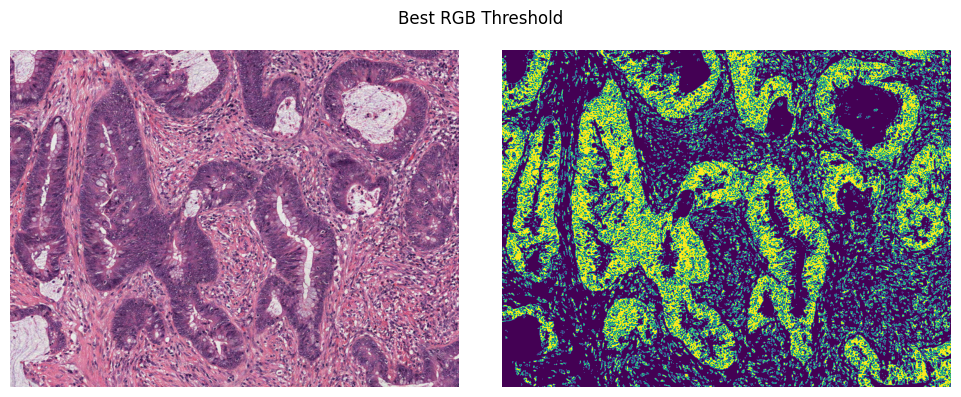

In [7]:
################################################################
############################ TEST ##############################
################################################################

# Plot best RGB thresholding
plot_thresholded_image(img=img_he, func=apply_rgb_threshold, title="Best RGB Threshold")

## Part 1.2 - Other colorspaces (3 pts)

So far we used the standard RGB colorspace to apply our thresholding. In this section, you will convert the image to a different color space. 

* **Q1 (1 pts)**: Use the function `rgb2hsv` from the skimage package ([see doc](https://scikit-image.org/docs/stable/auto_examples/color_exposure/plot_rgb_to_hsv.html)) to convert the input image from RGB to HSV in function `extract_hsv_channels`.
* **Q2 (1 pts)**: Can you see any difference between the use of the RGB or HSV space? (justify)
    * **Answer**: The approach is very similar, maybe using the RGB the background was more noisy

In [8]:
def extract_hsv_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.

    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # Define default values for HSV channels
    data_h = np.zeros((M, N))
    data_s = np.zeros((M, N))
    data_v = np.zeros((M, N))

    # ------------------
    # Your code here ...
    # ------------------

    hsv = rgb2hsv(img)
    data_h[:] = hsv[..., 0]
    data_s[:] = hsv[..., 1]
    data_v[:] = hsv[..., 2]

    return data_h, data_s, data_v

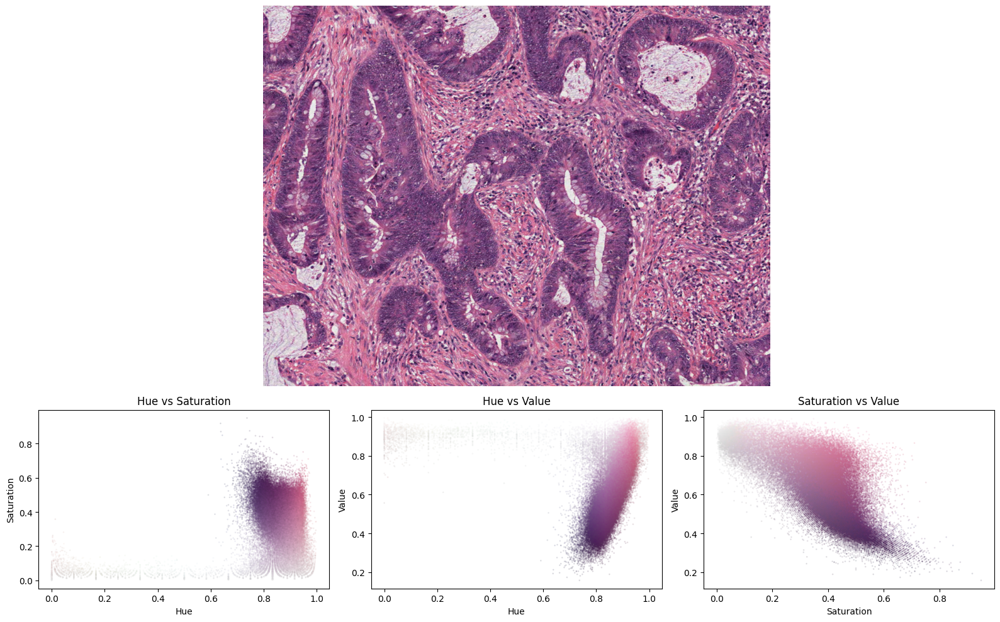

In [9]:
################################################################
############################ TEST ##############################
################################################################

# Call plotting function with your implemented function
plot_colors_histo(
    img=img_he,
    func=extract_hsv_channels,
    labels=["Hue", "Saturation", "Value"],
)

* **Q3 (1 pts)**: Based on your results, try again to find the best manual threshold in function `apply_hsv_threshold`. Do you think your estimation is reliable? (justify)
    * **Answer**: Our estimation is not reliable since we qualitatively chose the threshold values looking at the plot above.

In [10]:
def apply_hsv_threshold(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.

    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract HSV channels
    data_h, data_s, data_v = extract_hsv_channels(img=img)

    # ------------------
    # Your code here ...
    # ------------------

    range_h = (0.7, 0.9)
    range_s = (0.2, 0.6)
    range_v = (0.3, 0.6)
    img_th[
        (data_h >= range_h[0])
        & (data_h <= range_h[1])
        & (data_s >= range_s[0])
        & (data_s <= range_s[1])
        & (data_v >= range_v[0])
        & (data_v <= range_v[1])
    ] = 1

    return img_th

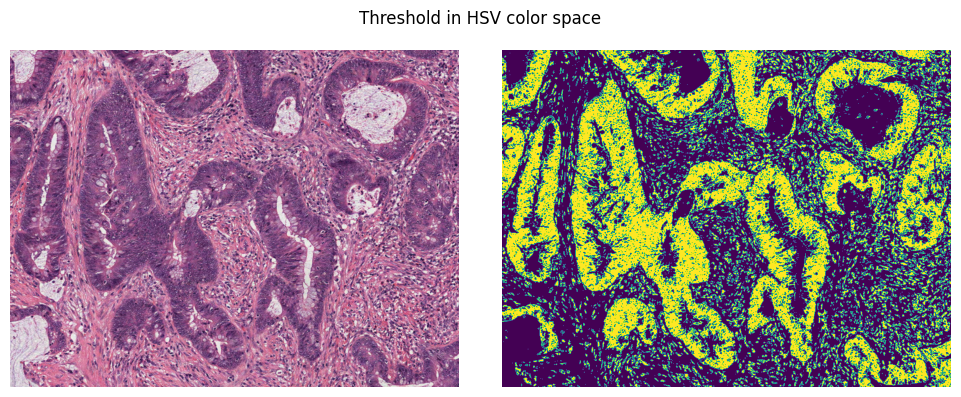

In [11]:
################################################################
############################ TEST ##############################
################################################################

# Find threshold(s) in the hsv channels
img_th = apply_hsv_threshold(img_he)
plot_thresholded_image(
    img=img_he, func=apply_hsv_threshold, title="Threshold in HSV color space"
)

## Part 1.3 - Morphology (5 pts)

To proceed, we will use your results from the previous thresholding (namely `apply_hsv_threshold`) as the starting point. In this exercise, we will try to clean the masked images using morphology to get a better estimation of the tumor area.

* **Q1 (1 pts)**: Implement the functions `apply_closing` and `apply_opening` with operations `closing` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing)), `opening` ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening)) using the disk sizes arguments ([see doc](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk)).
* **Q2 (1 pts)**: We test disk sizes: $1, 2, 5, 10$. Comment on the quality of the results.
    * **Answer**: For the closing we obtein an acceptable result with disk_sixe=1,2, instead for higer values the closing is too strong and  we can not identify tumor cells anymore. For the opening we obtein an acceptable result with disk_size=1 for the same reasons.

In [12]:
def apply_closing(img_th, disk_size):
    """
    Apply closing to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_closing: np.ndarray (M, N)
        Image after closing operation
    """

    # Define default value for output image
    img_closing = np.zeros_like(img_th)

    # ------------------
    # Your code here ...
    # ------------------

    closing(img_th, footprint=disk(radius=disk_size), out=img_closing, mode="nearest")

    return img_closing


def apply_opening(img_th, disk_size):
    """
    Apply opening to input mask image using disk shape.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    disk_size: int
        Size of the disk to use for opening

    Return
    ------
    img_opening: np.ndarray (M, N)
        Image after opening operation
    """

    # Define default value for output image
    img_opening = np.zeros_like(img_th)

    # ------------------
    # Your code here ...
    # ------------------

    opening(img_th, footprint=disk(radius=disk_size), out=img_opening, mode="nearest")

    return img_opening

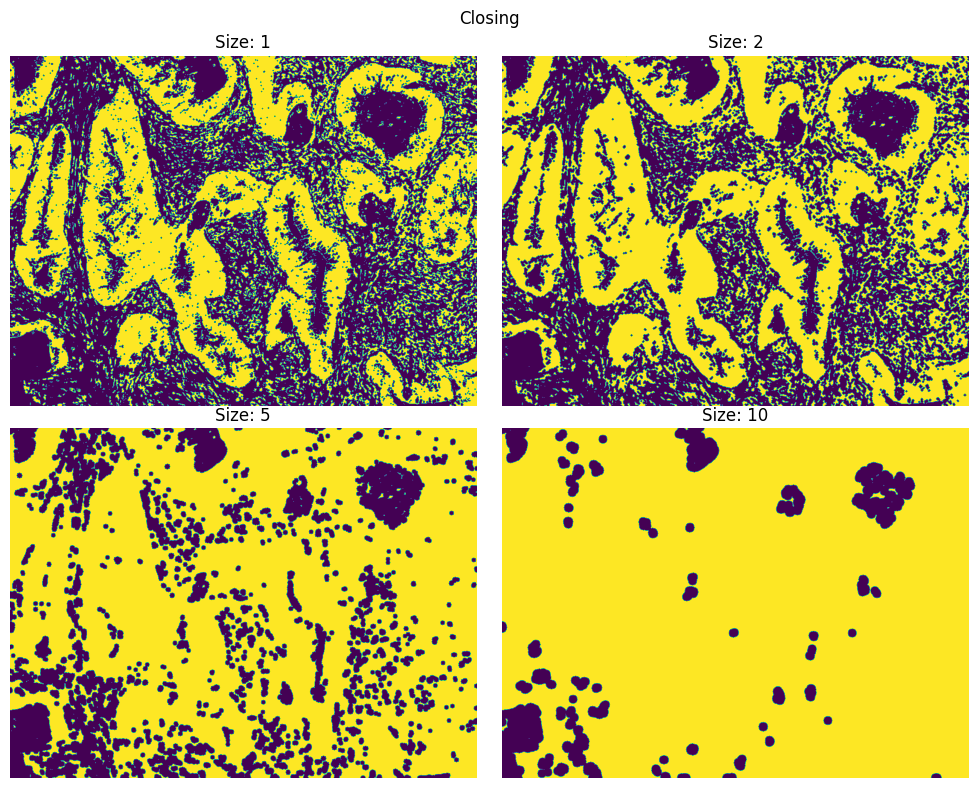

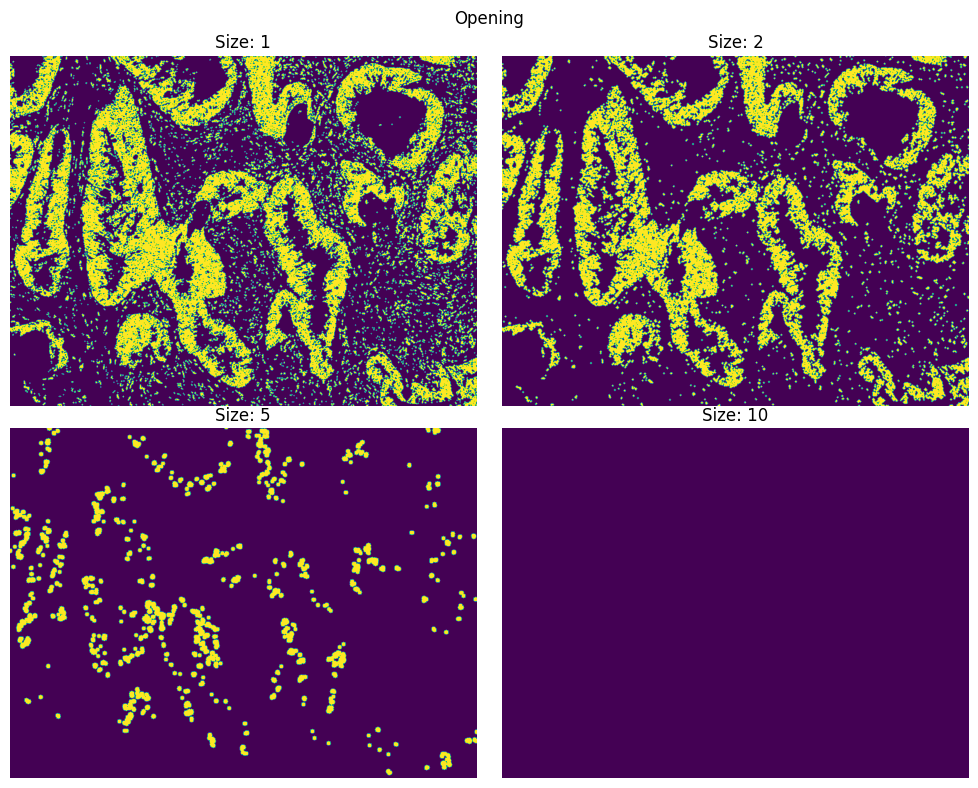

In [13]:
################################################################
############################ TEST ##############################
################################################################

plot_close_open(img_th, apply_closing, apply_opening)

* **Q3 (1 pts)** Implement the functions `remove_holes` and `remove_objects` using operations [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) from skimage package, respectively.
* **Q4 (1 pts)** We test the functions using area sizes: $10, 50, 100$, and $500$. Comment on the quality of the results.
    * **Answer**: For both remove_holes and remove_objects we obtein the best results for higher values of "size", since we have relatevely big holes and objects that we want to remove from the input image.

In [14]:
def remove_holes(img_th, size):
    """
    Remove holes from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of holes

    Return
    ------
    img_holes: np.ndarray (M, N)
        Image after remove holes operation
    """

    # Define default value for input image
    img_holes = np.zeros_like(img_th, dtype=np.bool)

    # ------------------
    # Your code here ...
    # ------------------

    remove_small_holes(img_th.astype(np.bool), area_threshold=size**2, out=img_holes)

    return img_holes


def remove_objects(img_th, size):
    """
    Remove objects from input image that are smaller than size argument.

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.
    size: int
        Minimal size of objects

    Return
    ------
    img_obj: np.ndarray (M, N)
        Image after remove small objects operation
    """

    # Define default value for input image
    img_obj = np.zeros_like(img_th, dtype=np.bool)

    # ------------------
    # Your code here ...
    # ------------------

    remove_small_objects(img_th.astype(np.bool), min_size=size, out=img_obj)

    return img_obj

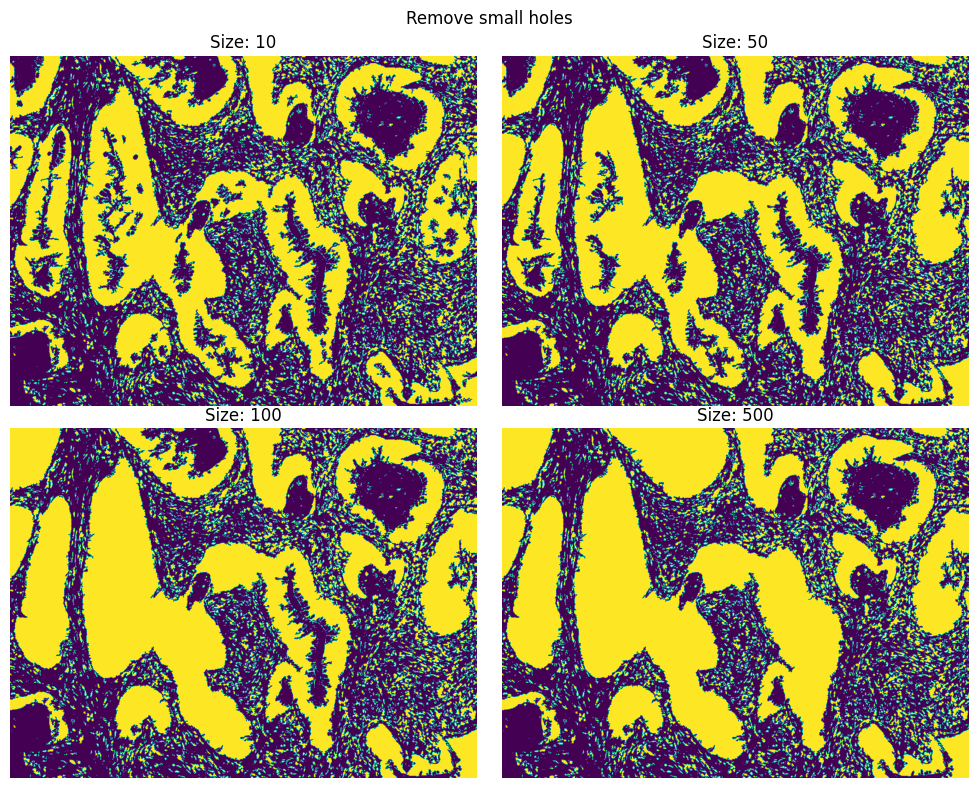

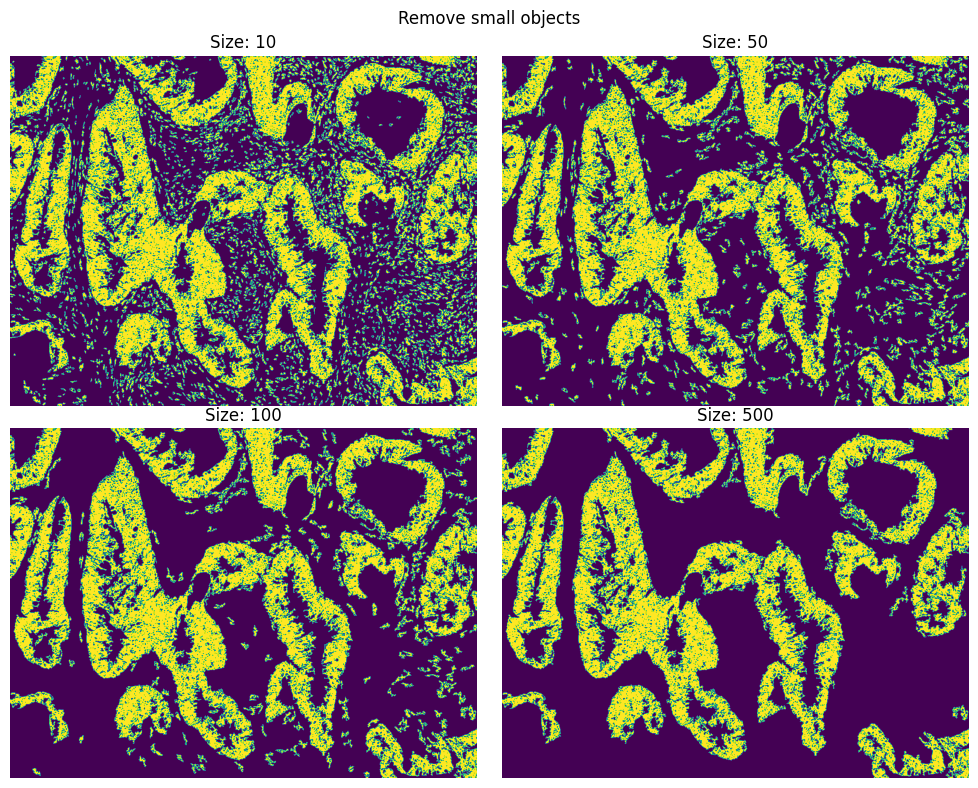

In [15]:
################################################################
############################ TEST ##############################
################################################################

plot_remove_holes_objects(img_th, remove_holes, remove_objects)

* **Q5 (1 pts)** Based on your previous results, implement the function `apply_morphology` that combines morphology functions to improve your tumor detection results from HSV thresholding. In this exercise, we prioritize having a higher number of false positives rather than false negatives, as mistakenly labeling non-tumor regions as tumors (over-segmentation) is preferable to missing actual tumor regions, which could lead to undetected cancerous areas and delayed treatment.

In [16]:
def apply_morphology(img_th):
    """
    Apply morphology to thresholded image

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.

    Return
    ------
    img_morph: np.ndarray (M, N)
        Image after morphological operations
    """

    img_morph = np.zeros_like(img_th)

    # ------------------
    # Your code here ...
    # ------------------

    img_morph[:] = remove_holes(img_th, size=30)
    img_morph[:] = remove_objects(img_morph, size=500)

    return img_morph

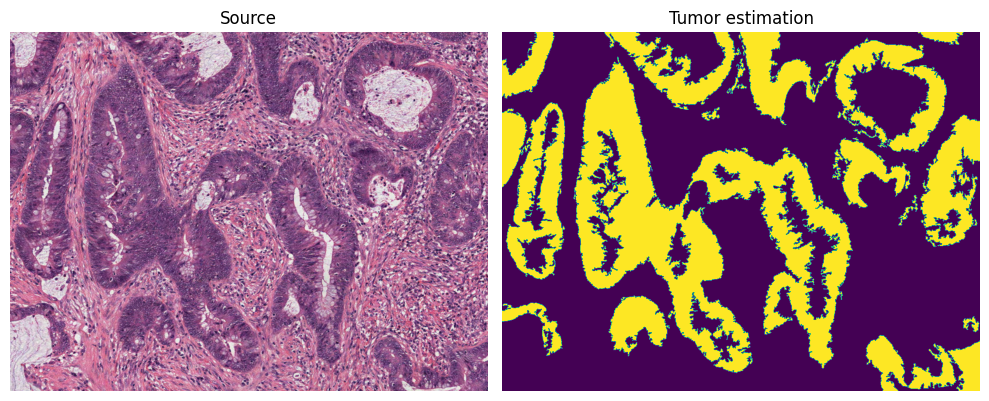

In [17]:
################################################################
############################ TEST ##############################
################################################################

img_best_morpho = apply_morphology(apply_hsv_threshold(img_he))
plot_morphology_best(
    img_source=img_he,
    img_best=img_best_morpho,
)

## Part 1.4 - Region Growing (4 pts)

* **Q1 (3 pts)** In this section we ask you to implement from scratch your own `region_growing` function to detect the tumor area. The function should take as input an RGB image, seeds that are manual initialization points in the tumor area, and the maximum number of iterations to perform. ote that the function also includes the kwargs argument. You can use it to add additional parameters to your function if needed (see [doc kwargs](https://book.pythontips.com/en/latest/args_and_kwargs.html)). Importantly, for timing reasons, a single explicit for loop on iterations is expected. An explicit for loop on pixels or neighbours will be accepted but penalised by 1 point. Use numpy tools to succeed.
* **Q2 (1 pts)** Your function is then used to perform region growing using multiple iterations. Comment on the quality of the results based on the number of iterations performed as well as the running time.
    * **Answer**: ...

In [18]:
def region_growing(seeds: list[tuple], img: np.ndarray, n_max: int = 10, **kwargs):
    """
    Run region growing on input image using seed points.

    Args
    ----
    seeds: list of tuple
        List of seed points
    img: np.ndarray (M, N, C)
        RGB image of size M, N, C
    n_max: int
        Number maximum of iterations before stopping algorithm
    max_difference: sequence of 3 floats
        Maximum difference between adjacent pixels for them to be
        considered as part of the region (homogeneity criterion).
    threshold_min: sequence of 3 floats
        Minimum value for an adjacent pixel to be considered part of the region.
        Note: if max_difference is specified, threshold_min is ignored.
    threshold_max: sequence of 3 floats
        Maximum value for an adjacent pixel to be considered part of the region.
        Note: if max_difference is specified, threshold_max is ignored.

    Return
    ------
    rg: np.ndarray (M, N)
        Image after region growing has been performed
    """

    M, N, _ = img.shape
    rg = np.zeros((M, N), dtype=np.bool)

    # ------------------
    # Your code here ...
    # ------------------

    if "max_difference" in kwargs:
        max_difference = np.array(kwargs["max_difference"])
        assert len(max_difference) == 3, "max_difference should contain 3 values"
    elif "threshold_min" in kwargs and "threshold_max" in kwargs:
        threshold_min = np.array(kwargs["threshold_min"])
        assert len(threshold_min) == 3, "threshold_min should contain 3 values"
        threshold_max = np.array(kwargs["threshold_max"])
        assert len(threshold_max) == 3, "threshold_max should contain 3 values"
    else:
        raise RuntimeError(
            "Function region_growing requires as arguments either "
            '"max_difference" or both "threshold_min" and "threshold_max"'
        )

    to_check = np.zeros((M, N), dtype=np.bool)
    checked = np.zeros((M, N), dtype=np.bool)

    # Set the seeds to belong to the regions
    seeds_arr = np.array(seeds)
    in_region_idx = seeds_arr.T
    rg[in_region_idx[0, :], in_region_idx[1, :]] = True
    checked[seeds_arr[:, 0], seeds_arr[:, 1]] = True

    # 8-way neighbour connectivity
    neighbour_offsets = np.array(
        [[1, 0], [1, 1], [0, 1], [-1, 1], [-1, 0], [-1, -1], [0, -1], [1, -1]],
        dtype=np.int32,
    ).T.reshape((2, 1, -1))

    for _ in range(n_max):
        # Get the indices of all the neighbours of the pixels that newly belong to the region
        new_idx_to_check = (
            in_region_idx.reshape((2, -1, 1)) + neighbour_offsets
        ).reshape((2, -1))

        if "max_difference" in kwargs:
            idx_to_check = in_region_idx.reshape((2, -1, 1)) + neighbour_offsets

            # Mask out out-of-bounds indices
            idx_i, idx_j = idx_to_check[0, ...], idx_to_check[1, ...]
            is_in_bounds = (idx_i >= 0) & (idx_i < M) & (idx_j >= 0) & (idx_j < N)

            # Mask out already checked pixels
            is_valid = is_in_bounds
            is_valid[is_in_bounds] &= ~checked[idx_i[is_in_bounds], idx_j[is_in_bounds]]
            if is_valid.sum() == 0:
                break

            # Mark checked pixels
            checked[idx_i[is_valid], idx_j[is_valid]] = True

            repeats = is_valid.sum(axis=1)
            idx_from = np.repeat(in_region_idx, repeats, axis=1)
            idx_to = idx_to_check[:, is_valid]
            img_float = img.astype(np.float32)
            diff = (
                img_float[idx_to[0, :], idx_to[1, :]]
                - img_float[idx_from[0, :], idx_from[1, :]]
            )
            diff_in_range = np.all(np.abs(diff) <= max_difference, axis=-1)
            in_region_idx = idx_to[:, diff_in_range]
            in_region_idx = np.unique(in_region_idx.T, axis=0).T
            if in_region_idx.shape[1] == 0:
                break

        else:
            # Filter out out-of-bounds indices
            idx_i, idx_j = new_idx_to_check[0, :], new_idx_to_check[1, :]
            is_valid = (idx_i >= 0) & (idx_i < M) & (idx_j >= 0) & (idx_j < N)
            new_idx_to_check = new_idx_to_check[:, is_valid]
            new_idx_i, new_idx_j = new_idx_to_check[0, :], new_idx_to_check[1, :]

            # New pixels to check, that were not checked yet
            to_check.fill(False)
            to_check[new_idx_i, new_idx_j] = ~checked[new_idx_i, new_idx_j]
            idx_to_check = to_check.nonzero()
            if len(idx_to_check[0]) == 0:
                break

            pixels_to_check = img[idx_to_check]
            checked[idx_to_check] = True
            idx_to_check = np.array(idx_to_check)

            in_region_pixels_idx = np.nonzero(
                (
                    (pixels_to_check >= threshold_min)
                    & (pixels_to_check <= threshold_max)
                ).all(axis=-1)
            )
            if len(in_region_pixels_idx[0]) == 0:
                break

            in_region_idx = idx_to_check[:, in_region_pixels_idx]

        rg[in_region_idx[0, :], in_region_idx[1, :]] = True

    return rg

In [19]:
# Add your additional arguments in the dictionary below
kwargs = {
    # "max_difference": [15, 15, 15],
    "threshold_min": [90, 45, 100],
    "threshold_max": [160, 125, 170],
}

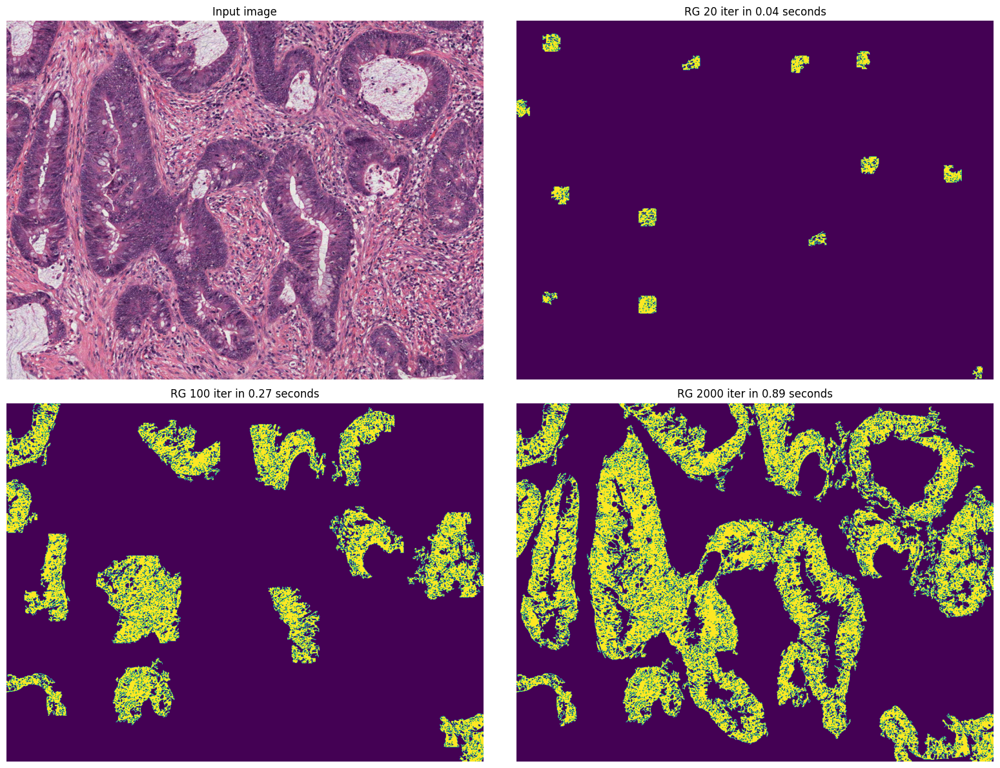

In [20]:
################################################################
############################ TEST ##############################
################################################################

img_grow = plot_tumor_region_growing(img_he, region_growing, **kwargs)

## Part 1.5 - Final Comparison (1 pts)

* **Q1 (1 pts)** Run the cell below. Based on your observation, which approach do you think gives the best estimation of the tumor area? (justify)
    * **Answer**: The best estimation is given by HSV threshold + Morphology. Indeed, the HSV threshold is too noisy in the background, while the region growing misses some areas of the tumor. HSV threshold + Morphology is more conservative, and since we prefer to retain more false positive, we think is the best estimation.

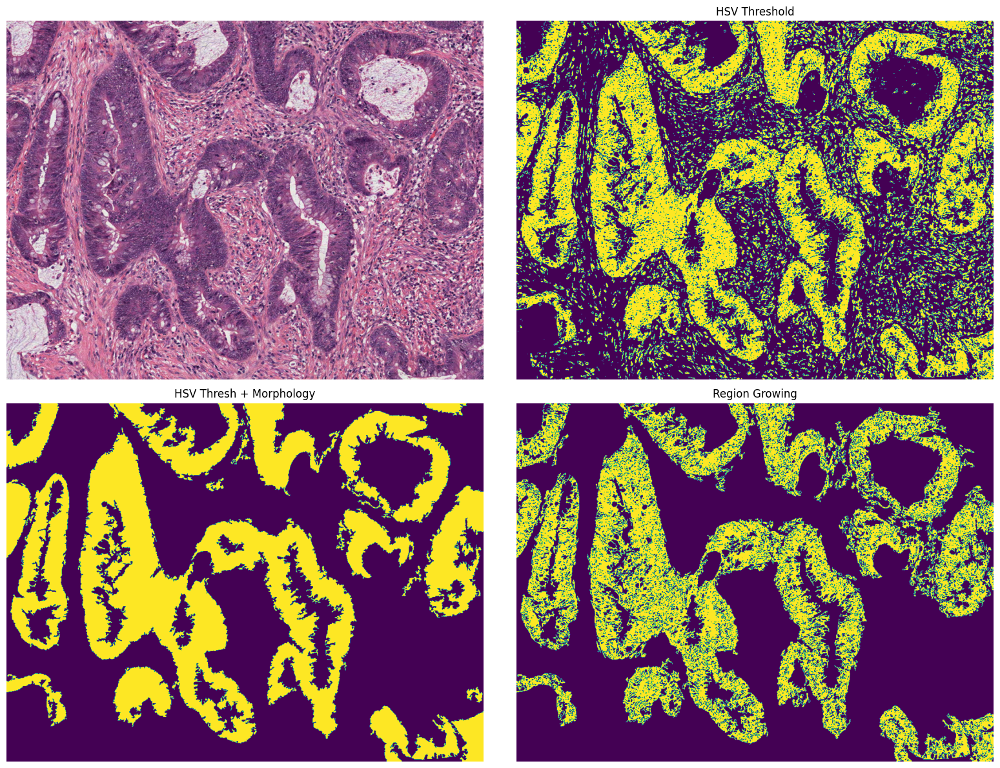

In [21]:
################################################################
############################ TEST ##############################
################################################################

plot_final_comparison(img_he, img_th, img_best_morpho, img_grow)

---
# Part 2 - Sandbox [8 pts]

For the second part, you will work on a new HE case without help. This time we ask you to
* **Q1 (4 pts)**: detect and compute the area of the blood cells,
* **Q2 (4 pts)**: detect and compute the area of the mucin.

Provide your results to the function `plot_results`. See the example below. Be careful, the completely white area is not mucin. It is the slide background and should be discarded. Moreover, you can focus on the large blood cell aggregates (large red areas)

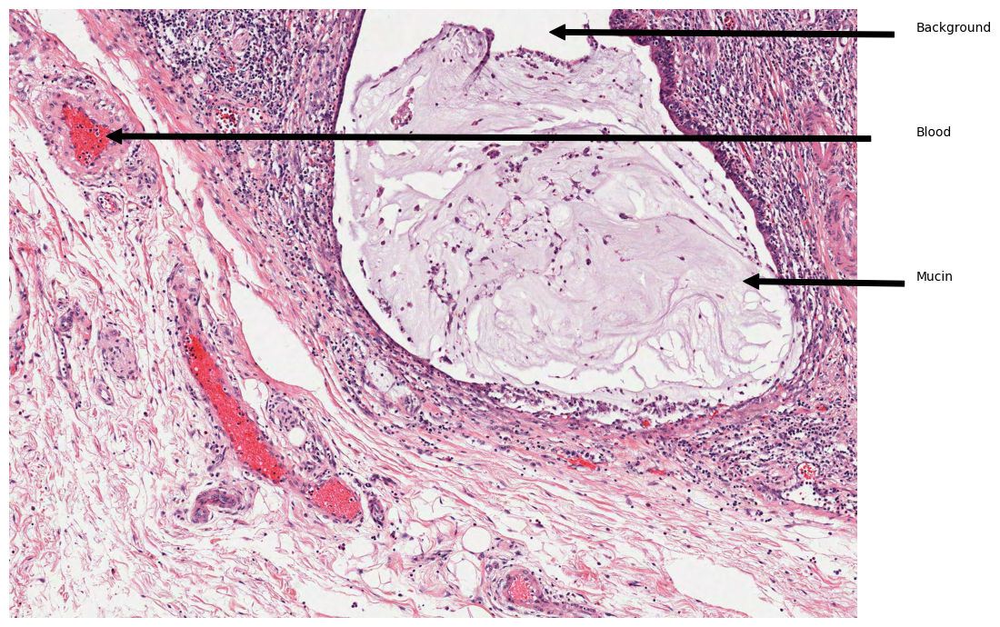

In [22]:
img_he2 = show_exo2_figure()

We start by plotting the RGB and HSV histograms to help determine whether thresholding can work, as well as pick the specific thresholds by inspecting the values.

In [ ]:
plot_colors_histo(
    img=img_he2,
    func=extract_rgb_channels,
    labels=["Red", "Green", "Blue"],
)
plot_colors_histo(
    img=img_he2,
    func=extract_hsv_channels,
    labels=["Hue", "Saturation", "Value"],
)

From the above histograms, we notice that using the HSV image with manual thresholding will probably work well for segmenting the blood cells, as their color is distinguishably more saturated and in a narrow hue band. This is especially visible in the hue vs saturation plot.

For the mucin, the distinction is less clear. We also notice that some parts of the mucin are darker and therefore will tend to be confused with the other medium-dark purple areas in the image. Instead, we notice that the mucin region is noticeably homogeneous and connex, meaning that it is a prime opportunity for region growing with a pixel difference homogeneity condition. However, if we just do region growing alone, the slide backgroud will get included in the region. This is because the difference between very light purple mucin and the white background is very small, and using a smaller difference criterion for region growing causes parts of the mucin to be missed altogether.

To solve this, we keep a reasonable max difference for the homogeneity criterion, but we first set the slide background to full black. This means the background will be different enough to not get included in the mucin region.

In [ ]:
M, N, C = np.shape(img_he2)
mask_blood = np.zeros((M, N), dtype=np.bool)
mask_mucin = np.zeros((M, N), dtype=np.bool)

# ------------------
# Your code here ...
# ------------------

# =============  Blood  ======================================================

# Blood cells are in a narrow red hue band, and noticeably more saturated than the rest.
h, s, v = extract_hsv_channels(img_he2)
mask_blood[(h >= 0.95) & (s >= 0.5) & (v >= 0.7)] = 1

# Remove small holes and only keep significant aggregates of blood cells by
# applying a closing operation followed by an opening operation.
mask_blood[:] = apply_closing(mask_blood, 10)
mask_blood[:] = apply_opening(mask_blood, 10)


# =============  Mucin  ======================================================

# Set slide background (white pixels) to black for better contrast with the mucin
img_he2_filtered = img_he2.copy()
img_he2_filtered[np.all(img_he2 > 230, axis=-1), :] = 0

# Region growing from inside the mucin
seeds = [(600, 1350), (250, 950)]
mask_mucin[:] = region_growing(
    seeds, img_he2_filtered, n_max=2000, max_difference=[12, 12, 12]
)

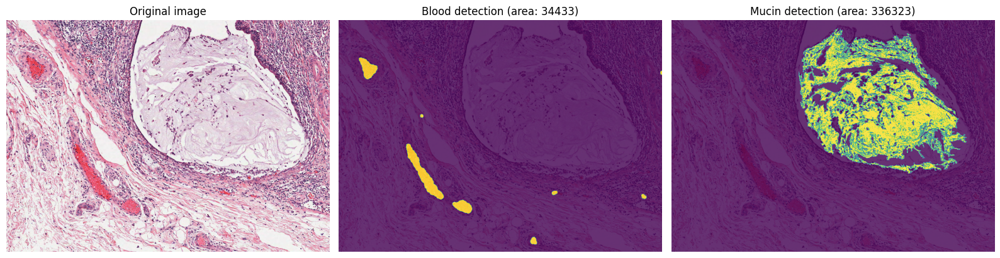

In [ ]:
################################################################
############################ TEST ##############################
################################################################

plot_results(img=img_he2, mask_blood=mask_blood, mask_mucin=mask_mucin)